[![Roboflow Notebooks](https://ik.imagekit.io/roboflow/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Image Embeddings Analysis - Part 1

---

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Vocabulary
- Before you start
- Clustering MNIST images using on pixel brightness
- Clustering images using OpenAI CLIP embeddings
- Using OpenAI CLIP embeddings to detect duplicates or close duplicates

## Let's begin!

## Vocabulary

- `embeddings` are a way of representing data in a lower-dimensional space while preserving certain properties, such as the relationships between the data points. They are often used in natural language processing (NLP) to represent words as vectors in a lower-dimensional space, allowing algorithms to process and analyze text more efficiently.
- `high dimensional space` is a space with many dimensions or variables. For example, a 2-dimensional space has two dimensions (x and y), while a 3-dimensional space has three dimensions (x, y, and z). In machine learning, high-dimensional spaces often refer to data sets with many features or attributes, where each feature can be thought of as a dimension.
- `OpenAI's CLIP` (Contrastive Language-Image Pre-Training) is an artificial intelligence model that can understand both text and images. It can be used to generate embeddings, which are a way of representing data in a lower-dimensional space while preserving certain properties. CLIP's embeddings can be used for tasks such as image search, where similar images can be found based on their visual features or the text associated with them.
- `T-SNE` is a technique used for visualizing high-dimensional data in a lower-dimensional space, such as 2D or 3D. It is particularly useful for identifying clusters or patterns in complex data sets. T-SNE works by finding a way to represent each data point as a point in a lower-dimensional space, while preserving the similarities between the data points in the original high-dimensional space.
- `vector normalization` is a process that scales a vector to have a unit length (i.e., a length of 1). This is achieved by dividing each element in the vector by the magnitude of the vector, which is calculated as the square root of the sum of the squared elements. Vector normalization is often used in machine learning to ensure that the scale of different features or attributes does not affect the performance of the model.

## Before you start

In [1]:
!pip install -qqq roboflow supervision umap-learn

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant. 

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


## Clustering MNIST images using on pixel brightness

The MNIST dataset is a collection of handwritten digits that is commonly used in machine learning research. The dataset consists of 60,000 training images and 10,000 testing images, each of which is a grayscale image of size 28x28 pixels. The goal of using the MNIST dataset is often to train a machine learning model to recognize handwritten digits.

### Download MNIST dataset from Roboflow

In [3]:
%cd {HOME}
!pip install roboflow
import roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="0a4WwzoVWX7OLQHdybod")
project = rf.workspace("popular-benchmarks").project("mnist-cjkff")
dataset = project.version(3).download("folder")

/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to MNIST-3 in folder:: 100%|██████████| 70024/70024 [00:14<00:00, 4696.21it/s]


**NOTE:** List of dataset classes

In [4]:
!ls {dataset.location}/train

0  1  2  3  4  5  6  7	8  9


### Process data


![MNIST](https://media.roboflow.com/notebooks/examples/mnist-1.png?updatedAt=1682524874592)

In [5]:
PER_CLASS_IMAGE_COUNT = 500

In [6]:
import base64

def image_to_data_uri(image_path):
    with open(image_path, "rb") as image_file:
        encoded_image = base64.b64encode(image_file.read()).decode("utf-8")
    return "data:image/jpeg;base64," + encoded_image

In [7]:
import os
import cv2
import supervision as sv
import numpy as np

SOURCE_DIR = os.path.join(dataset.location, "train")

labels = []
train = []
images = []
image_paths = []

class_ids = sorted(os.listdir(SOURCE_DIR))

for class_id in class_ids:
    source_subdir = os.path.join(SOURCE_DIR, class_id)
    for image_path in sv.list_files_with_extensions(source_subdir)[:PER_CLASS_IMAGE_COUNT]:
        image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
        labels.append(class_id)
        images.append(image)
        image_paths.append(str(image_path))
        train.append(image.flatten())

# class associated with image
labels = np.array(labels)
# features extracted from image
train = np.array(train)
# local image path
image_paths = np.array(image_paths)
# cached images
image_data_uris = {path: image_to_data_uri(path) for path in image_paths}

**NOTE:** Let's take a look at random data sample.

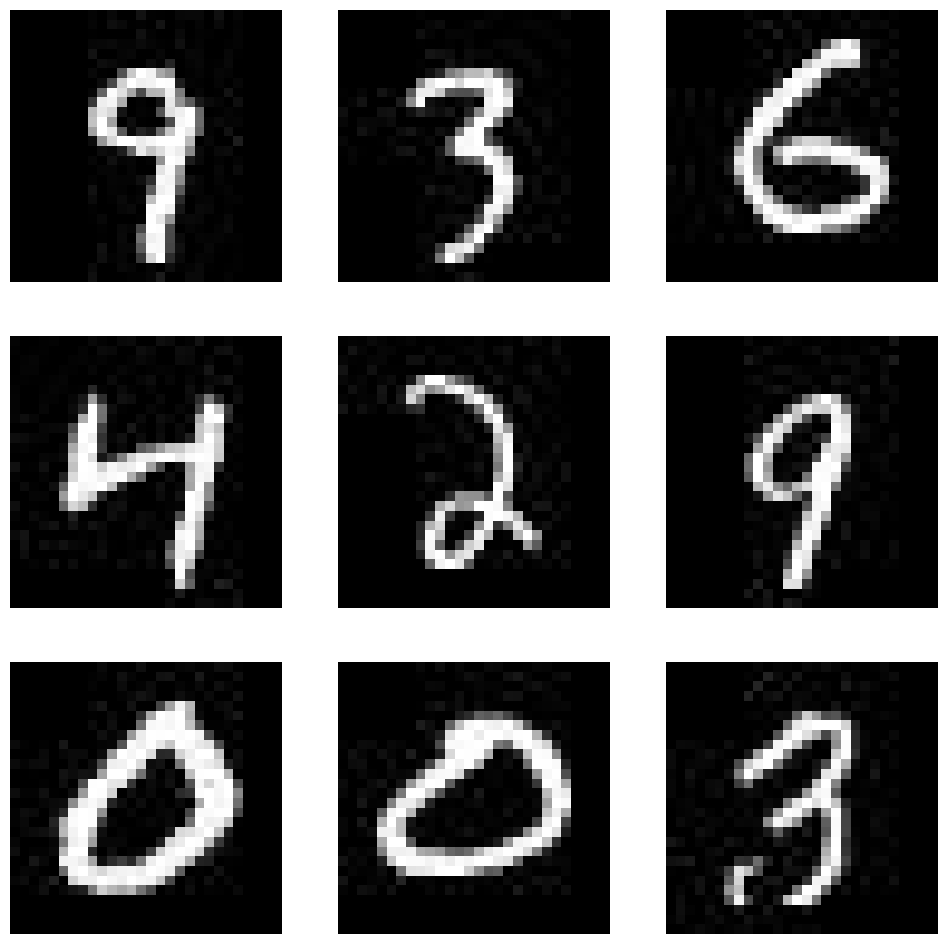

In [8]:
import random
images_sample = random.sample(images, 9)
sv.plot_images_grid(images_sample, grid_size=(3, 3))

### Generate T-SNE projections

Use T-SNE to reduce number of dimensions in our data from `784` (`28x28`) to `3`. 

In [9]:
from sklearn.manifold import TSNE
import time

start = time.time()
tsne = TSNE(n_components = 3, random_state=0)
projections = tsne.fit_transform(train)
end = time.time()
print(f"generating projections with T-SNE took: {(end-start):.2f} sec")

generating projections with T-SNE took: 180.59 sec


### Visualization

In [10]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

from typing import Dict
from pathlib import Path
from IPython.core.display import display, HTML


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    image_paths: np.ndarray,
    image_data_uris: Dict[str, str],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    # Create a separate trace for each unique label
    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_paths[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>path: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    # Create the 3D scatter plot
    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    # Convert the chart to an HTML div string and add an ID to the div
    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    # Define your JavaScript code for copying text on point click
    javascript_code = f"""
    <script>
        function displayImage(imagePath) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imagePath];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        // Get the Plotly chart element by its ID
        var chartElement = document.getElementById('scatter-plot-3d');

        // Add a click event listener to the chart element
        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    # Create an HTML template including the chart div and JavaScript code
    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    # Display the HTML template in the Jupyter Notebook
    display(HTML(html_template))

**NOTE:** 👆 click on data point (dot) to see associated image.

In [11]:
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)

### Generate UMAP projections

UMAP (Uniform Manifold Approximation and Projection) is a dimensionality reduction technique that is similar to T-SNE but has some advantages. Unlike T-SNE, UMAP scales better to large datasets and has a more stable embedding. UMAP also allows for the use of different distance metrics and can handle non-Euclidean data, making it more flexible than T-SNE.

In [12]:
import umap
import time

start = time.time()
projections = umap.UMAP(n_components=3).fit_transform(train)
end = time.time()
print(f"generating projections with UMAP took: {(end-start):.2f} sec")

generating projections with UMAP took: 36.10 sec


In [13]:
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)

## Clustering images using OpenAI CLIP embeddings

Clustering images based solely on pixel color values can be difficult because pixels alone do not always convey meaningful information about the content of an image. For example, two images could have similar pixel values but depict different objects or scenes. This approach can work for small images like MNIST 28x28 because they contain only a small number of pixels and relatively simple shapes, making it easier to identify patterns based on pixel values alone. However, for larger images, the complexity of the images and the number of possible pixel values makes it much more difficult to identify meaningful patterns using pixel values alone.

![EMBEDDINGS](https://media.roboflow.com/notebooks/examples/clip.png)

OpenAI's CLIP model is a better choice for image clustering because it can understand both text and images, allowing it to learn the relationship between visual and semantic concepts. CLIP generates embeddings that capture the semantic meaning of an image, rather than just its pixel values. These embeddings can be used for image clustering, where images with similar semantic content are grouped together. This approach is more effective because it captures the complex relationships between objects and scenes that are not easily captured by pixel values alone. Overall, using OpenAI's embeddings is a more accurate and efficient way to cluster images based on their content.

In [15]:
#@title Pull Data from Roboflow API
ROBOFLOW_DATASET_URL = "https://universe.roboflow.com/brac-university-v9w2y/fruit-freshness-detection-08shj/dataset/8" #@param {type:"string"}
IMAGE_COUNT = 500 #@param {type: "number"}


import re
import requests
from typing import List, Tuple, Dict
from tqdm.notebook import tqdm
from multiprocessing import Pool


def extract_roboflow_metadata(url: str) -> tuple:
    match = re.search(r'https://(?:app|universe)\.roboflow\.com/([^/]+)/([^/]+)(?:/dataset)?/([^/]+)', url)
    if match:
        workspace_name = match.group(1)
        project_name = match.group(2)
        project_version = match.group(3)
        return workspace_name, project_name, project_version
    else:
        raise ValueError(f"Invalid Roboflow dataset url ❌ "
                         f"Expected: https://universe.roboflow.com/workspace_name/project_name/project_version. "
                         f"Given: {url}")
        

def load_project_info(workspace_name: str, project_name: str, key: str) -> dict:
    project_url = f'https://api.roboflow.com/{workspace_name}/{project_name}'
    print(f'loading project info from: {project_url} ...')
    response = requests.get(
        project_url,
        headers={
            'Authorization': f'Bearer {key}'
        }
    )
    if response.status_code != 200:
        print(f"Error: {response.status_code}. {response.json().get('error', 'No additional information available.')}")
        assert(response.status_code == 200)
    return response.json()


def load_images_data(workspace_name: str, project_name: str, key: str, limit: int) -> List[dict]:
    search_url = f'https://api.roboflow.com/{workspace_name}/{project_name}/search'
    print(f'loading embeddings via roboflow search from: {search_url} ...')

    offset = 0
    images = []

    while True:
        response = requests.post(
            search_url,
            json={
                'prompt': "random",
                'limit': 250,
                'offset': offset,
                'fields': ['id', 'owner', 'name', 'split', 'annotations', 'embedding']
            },
            headers={
                'Authorization': f'Bearer {key}'
            }
        )

        if response.status_code != 200:
            print(f"Error: {response.status_code}. {response.json().get('error', 'No additional information available.')}")
            break

        results = response.json().get('results', [])
        results_count = len(results)

        offset = offset + results_count
        images = images + results

        if results_count == 0 or len(images) >= limit:
            break

    for image in images:
        image['thumbnail_url'] = f"https://storage.googleapis.com/roboflow-platform-sources/{image['owner']}/{image['id']}/thumb.jpg"

    return images


def image_url_to_data_uri(image_path):
    if image_path.startswith("http"):
        response = requests.get(image_path)
        image_data = response.content
    else:
        with open(image_path, "rb") as image_file:
            image_data = image_file.read()

    encoded_image = base64.b64encode(image_data).decode("utf-8")
    return "data:image/jpeg;base64," + encoded_image


def postprocess_images_data(
    images_data: List[dict]
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    splits = []
    labels = []
    train = []
    image_paths = []

    for image_data in images_data:
        split = image_data["split"]
        splits.append(split)
        embedding = image_data["embedding"]
        train.append(embedding)
        image_path = image_data["thumbnail_url"]
        image_paths.append(image_path)
        label = " ".join(sorted(set(image_data["annotations"]["classes"].keys())))
        labels.append(label)

    return np.array(splits), np.array(labels), np.array(train), np.array(image_paths)


def cache_image_thumbnails(image_paths: List[str]) -> Dict[str, str]: 
    print(f'caching image thumbnails...')
    total = len(image_paths)
    with Pool(8) as p:
        thumbnails = list(tqdm(p.imap(image_url_to_data_uri, image_paths), total=total))
    return {
        image_path: thumbnail
        for image_path, thumbnail
        in zip(image_paths, thumbnails)
    }

workspace_name, project_name, project_version = extract_roboflow_metadata(url=ROBOFLOW_DATASET_URL)
project_info = load_project_info(
    workspace_name=workspace_name, 
    project_name=project_name, 
    key=roboflow.load_roboflow_api_key())
annotation_name = project_info.get("project").get("annotation")

images_data = load_images_data(
    workspace_name=workspace_name, 
    project_name=project_name, 
    key=roboflow.load_roboflow_api_key(), 
    limit=IMAGE_COUNT)
print(f"loaded {len(images_data)} embeddings.")

splits, labels, embeddings, image_paths = postprocess_images_data(
    images_data=images_data)

# cached images
image_data_uris = cache_image_thumbnails(image_paths=image_paths)

loading project info from: https://api.roboflow.com/brac-university-v9w2y/fruit-freshness-detection-08shj ...
Error: 401. {'message': 'This API key does not exist (or has been revoked).', 'type': 'OAuthException', 'hint': 'You may retrieve your API key via the Roboflow Dashboard. Go to Account > Roboflow Keys to retrieve yours.', 'key': 'None'}


AssertionError: ignored

In [16]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0a4WwzoVWX7OLQHdybod")
project = rf.workspace("brac-university-v9w2y").project("fruit-freshness-detection-08shj")
dataset = project.version(8).download("coco")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Fruit-Freshness-Detection-8 in coco:: 100%|██████████| 12418/12418 [00:10<00:00, 1166.97it/s]


**NOTE:** Roboflow Search use CLIP ViT-L/14 to generate our embeddings. Let's use T-SNE to reduce number of dimensions in our data from `768` to `3`.

In [17]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 3, random_state=0)
projections = tsne.fit_transform(embeddings)

NameError: ignored

### Visualization by category

T-SNE is a great way to visualize categories because it can reduce the dimensionality of the data to two or three dimensions, which makes it possible to plot the data and see how it is organized in a way that is easy to interpret. When we cluster data using T-SNE, we can see which data points are similar to each other based on their features, such as color or texture. This allows us to visually identify patterns and similarities between categories.

In [ ]:
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris,
    show_legend=True,
    show_markers_with_text=False
)

### Visualization by split

We can use T-SNE clustering to visualize:

- The randomness of the split: It's important to ensure that the data is split randomly to avoid any biases in the training, testing, or validation sets.

- The representativeness of the split: The data should be split in a way that is representative of the overall dataset. This means that each set should have a similar distribution of data points across different classes or categories.

In [ ]:
display_projections(
    labels=splits,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris,
    show_legend=True,
    show_markers_with_text=False
)

## Using OpenAI CLIP embeddings to detect duplicates or close duplicates

CLIP embeddings can be used to detect similar images by comparing the embeddings of different images. A common way to measure similarity between vectors is by calculating the cosine similarity. 

### Cosine similarity calculation


![COSINE-SIMILARITY](https://media.roboflow.com/notebooks/examples/cosine-similarity.png)

Normalization is an important step when computing cosine similarity because it makes the vectors unit length. This ensures that the cosine similarity only measures the angular distance between the vectors and not their magnitudes.

Cosine similarity measures the angle between two vectors, and it's defined as the dot product of the vectors divided by the product of their magnitudes:

```
cosine_similarity(A, B) = dot(A, B) / (||A|| * ||B||)
```

When you normalize the vectors, their magnitudes become 1:

```
||A_normalized|| = ||B_normalized|| = 1
```

Thus, the cosine similarity formula simplifies to:

```
cosine_similarity(A_normalized, B_normalized) = dot(A_normalized, B_normalized)
```

In [ ]:
import numpy as np

def normalize(vec: np.ndarray):
    return vec / np.linalg.norm(vec, axis=1, keepdims=True)

In [ ]:
normalized_embeddings = normalize(embeddings)
cosine_sim_matrix = np.dot(normalized_embeddings, normalized_embeddings.T)

### Cosine similarity matrix visualization

**NOTE:** Due to the large number of images being processed, the graph below may be difficult to read. Keep in mind that the `plotly` library - which we use for data visualization - allows you to enlarge a selected part of the graph.

In [ ]:
import numpy as np
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(z=cosine_sim_matrix, colorscale='Viridis'))

fig.update_layout(
    title="Cosine Similarity Matrix",
    xaxis_title="Image Index",
    yaxis_title="Image Index",
    font=dict(size=14),
    width=1000,
    height=1000,
    margin=dict(t=100, r=100, b=100, l=100),
)

fig.show()

In [ ]:
#@title Search most similar images

IMAGE_INDEX = 250 #@param {type: "number"}
SIMILAR_IMAGE_COUNT = 10 #@param {type: "number"}

import cv2
import base64
import numpy as np
from PIL import Image
from io import BytesIO

def get_n_most_similar_images(
    cosine_sim_matrix: np.ndarray, 
    image_index: int, 
    similar_image_count: int
) -> np.ndarray:
    similarities = cosine_sim_matrix[image_index]
    sorted_indices = np.argsort(similarities)[::-1]
    return sorted_indices[1:similar_image_count+1]

def preprocess_image_data(image_data: str) -> np.ndarray:
    image_data = base64.b64decode(image_data.split(",")[-1])
    image = Image.open(BytesIO(image_data))
    image_array = np.array(image)
    return cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

most_similar_indices = get_n_most_similar_images(
    cosine_sim_matrix=cosine_sim_matrix, 
    image_index=IMAGE_INDEX, 
    similar_image_count=SIMILAR_IMAGE_COUNT)
most_similar_cosine_values = cosine_sim_matrix[IMAGE_INDEX, most_similar_indices]

image_path = image_paths[IMAGE_INDEX]
image_data = image_data_uris[image_path]
image_array = preprocess_image_data(image_data=image_data)

image_arrays = [image_array]
image_titles = ["original image"]

for image_index, similarity_score in zip(most_similar_indices, most_similar_cosine_values):
    image_path = image_paths[image_index]
    image_data = image_data_uris[image_path]
    image_array = preprocess_image_data(image_data=image_data)
    image_arrays.append(image_array)
    image_titles.append(f"similarity score: {similarity_score:.4f}")

image_count = len(image_arrays)
sv.plot_images_grid(
    images=image_arrays, 
    titles=image_titles, 
    grid_size=(1, image_count), 
    size=(4 * image_count, 4))

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.